# The Nature Conservancy Fisheries Monitoring

https://www.kaggle.com/c/the-nature-conservancy-fisheries-monitoring

In [1]:
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
from tqdm.notebook import tqdm
from scipy.special import softmax

print(tf.__version__)

2.5.0


# Загружаем разметку

In [2]:
import os
import json
from glob import glob

TRAIN_PREFIX = 'data/fish/train'

def load_annotations():
    boxes = dict()
    for path in glob('data/fish/boxes/*.json'):
        label = os.path.basename(path).split('_', 1)[0]
        with open(path) as src:
            for annotation in json.load(src):
                basename = os.path.basename(annotation['filename'])
                annotation['filename'] = os.path.join(
                    TRAIN_PREFIX, label.upper(), basename)
                for rect in annotation['annotations']:
                    rect['x'] += rect['width'] / 2
                    rect['y'] += rect['height'] / 2
                if os.path.isfile(annotation['filename']):
                    boxes.setdefault(label, []).append(annotation)
    return boxes

def draw_boxes(annotation, rectangles=None, image_size=None):
    
    def _draw(img, rectangles, scale_x, scale_y, color=(0, 255, 0)):
        for rect in rectangles:
            pt1 = (int((rect['x'] - rect['width'] / 2) * scale_x),
                   int((rect['y'] - rect['height'] / 2) * scale_y))
            pt2 = (int((rect['x'] + rect['width'] / 2) * scale_x),
                   int((rect['y'] + rect['height'] / 2) * scale_y))
            img = cv2.rectangle(img.copy(), pt1, pt2, 
                                color=color, thickness=4)
        return img
    
    scale_x, scale_y = 1., 1.
    
    img = cv2.imread(annotation['filename'], cv2.IMREAD_COLOR)[...,::-1]
    if image_size is not None:
        scale_x = 1. * image_size[0] / img.shape[1]
        scale_y = 1. * image_size[1] / img.shape[0]
        img = cv2.resize(img, image_size)
        
    img = _draw(img, annotation.get('annotations', []), scale_x, scale_y)
    
    if rectangles is not None:
        img = _draw(img, rectangles, 1., 1., (255, 0, 0))

    return img

### Визуализируем разметку

In [3]:
boxes = load_annotations()  # загружаем разметку детекций

In [4]:
counts_data=pd.DataFrame(
    [(k, len(v)) for k, v in boxes.items()],
    columns=['class', 'count'])

fish_classes = counts_data['class'].values
counts_data

,class,count
0,alb,1719
1,bet,200
2,dol,117
3,lag,67
4,shark,176
5,yft,734


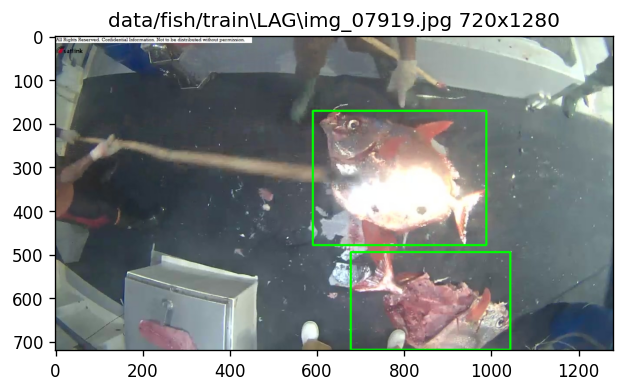

In [5]:
from matplotlib import pyplot as plt


annotation = boxes['lag'][0]
img = draw_boxes(annotation)

plt.figure(figsize=(6, 6), dpi=120)
plt.imshow(img)
plt.title('{} {}x{}'.format(
    annotation['filename'], img.shape[0], img.shape[1]));

### Распределение размеров разметки

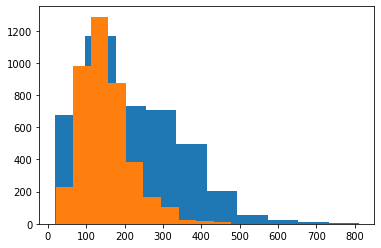

In [6]:
annotations = sum([box['annotations']
                   for box in sum(boxes.values(), [])], [])

widths = [rect['width'] for rect in annotations]
heights = [rect['height'] for rect in annotations]

plt.hist(widths)
plt.hist(heights);

# Экстрактор признаков

In [7]:
from tensorflow.keras.applications.resnet50 import ResNet50 
from tensorflow.keras.applications import vgg16

IMG_HEIGHT = 750
IMG_WIDTH = 1200

features = vgg16.VGG16(weights='imagenet',
                       include_top=False,
                       input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# дообучаем последние 5 слоев
for layer in features.layers[:-5]:
    layer.trainable = False
    
feature_tensor = features.layers[-1].output
print(feature_tensor.shape)

(None, 23, 37, 512)


# Сетка якорей (anchor grid)

In [8]:
FEATURE_SHAPE = (feature_tensor.shape[1],
                 feature_tensor.shape[2])

GRID_STEP_H = IMG_HEIGHT / FEATURE_SHAPE[0]
GRID_STEP_W = IMG_WIDTH / FEATURE_SHAPE[1]

ANCHOR_WIDTH = 150.
ANCHOR_HEIGHT = 150. 

# сетка якорей, размер определяется соотношением 
# размера входного изображения и размером тензора признаков
ANCHOR_CENTERS = np.mgrid[GRID_STEP_H/2:IMG_HEIGHT:GRID_STEP_H,
                          GRID_STEP_W/2:IMG_WIDTH:GRID_STEP_W]

In [59]:
def iou(rect, x_scale, y_scale, anchor_x, anchor_y,
        anchor_w=ANCHOR_WIDTH, anchor_h=ANCHOR_HEIGHT):
    
    rect_x1 = (rect['x'] - rect['width'] / 2) * x_scale
    rect_x2 = (rect['x'] + rect['width'] / 2) * x_scale
    
    rect_y1 = (rect['y'] - rect['height'] / 2) * y_scale
    rect_y2 = (rect['y'] + rect['height'] / 2) * y_scale
    
    anch_x1, anch_x2 = anchor_x - anchor_w / 2, anchor_x + anchor_w / 2
    anch_y1, anch_y2 = anchor_y - anchor_h / 2, anchor_y + anchor_h / 2
    
    dx = (min(rect_x2, anch_x2) - max(rect_x1, anch_x1))
    dy = (min(rect_y2, anch_y2) - max(rect_y1, anch_y1))
    
    intersection = dx * dy if (dx > 0 and dy > 0) else 0.
    
    anch_square = (anch_x2 - anch_x1) * (anch_y2 - anch_y1)
    rect_square = (rect_x2 - rect_x1) * (rect_y2 - rect_y1)
    union = anch_square + rect_square - intersection
    
    return intersection / union

def encode_anchors(annotation, img_shape, iou_thr=0.5):
    encoded = np.zeros(shape=(FEATURE_SHAPE[0],
                              FEATURE_SHAPE[1], 11), dtype=np.float32)
    x_scale = 1. * IMG_WIDTH / img_shape[1]
    y_scale = 1. * IMG_HEIGHT / img_shape[0]
    for rect in annotation['annotations']:
        scores = []
        label = fish_classes == rect['class']
                
        for row in range(FEATURE_SHAPE[0]):
            for col in range(FEATURE_SHAPE[1]):
                anchor_x = ANCHOR_CENTERS[1, row, col]
                anchor_y = ANCHOR_CENTERS[0, row, col]
                score = iou(rect, x_scale, y_scale, anchor_x, anchor_y)
                scores.append((score, anchor_x, anchor_y, row, col))
        
        scores = sorted(scores, reverse=True)
        if scores[0][0] < iou_thr:
            scores = [scores[0]]  # default anchor
        else:
            scores = [e for e in scores if e[0] > iou_thr]
            
        for score, anchor_x, anchor_y, row, col in scores:
            dx = (anchor_x - rect['x'] * x_scale) / ANCHOR_WIDTH
            dy = (anchor_y - rect['y'] * y_scale) / ANCHOR_HEIGHT
            dw = (ANCHOR_WIDTH - rect['width'] * x_scale) / ANCHOR_WIDTH
            dh = (ANCHOR_HEIGHT - rect['height'] * y_scale) / ANCHOR_HEIGHT
            encoded[row, col] = np.array([*label, 1., dx, dy, dw, dh])

    return encoded

def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

#keras.activations.softmax(x, axis=-1)

def decode_prediction(prediction, conf_thr=0.1):
    rectangles = []
    for row in range(FEATURE_SHAPE[0]):
        for col in range(FEATURE_SHAPE[1]):
            
            label = np.empty(6)
            label[0], label[1], label[2], label[3], label[4], label[5], conf, dx, dy, dw, dh = prediction[row, col]
            conf = _sigmoid(conf)
            label = softmax(label)

            if conf > conf_thr:
                anchor_x = ANCHOR_CENTERS[1, row, col]
                anchor_y = ANCHOR_CENTERS[0, row, col]
                rectangles.append({'x': anchor_x - dx * ANCHOR_WIDTH,
                                   'y': anchor_y - dy * ANCHOR_HEIGHT,
                                   'width': ANCHOR_WIDTH - dw * ANCHOR_WIDTH,
                                   'height': ANCHOR_HEIGHT - dh * ANCHOR_HEIGHT,
                                   'conf': conf,
                                   'label': np.argmax(_sigmoid(label)),
                                   'labels': label })
    return rectangles

def non_max_suppression(rectangles, max_output_size, iou_threshold=0.5):
    if not rectangles:
        return rectangles
    
    boxes = [[r['y'],
              r['x'],
              r['y'] + r['height'],
              r['x'] + r['width']] for r in rectangles]
    scores = [r['conf'] for r in rectangles]
    indices = tf.image.non_max_suppression(np.array(boxes),
                                           np.array(scores),
                                           max_output_size,
                                           iou_threshold)
    
    return [rectangles[i] for i in indices]

### Валидация энкодинга/декодинга якорей

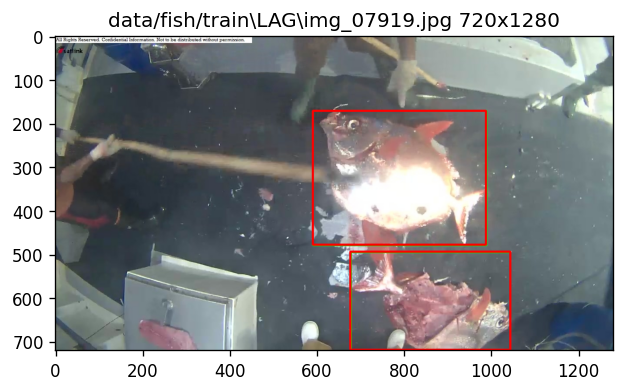

In [10]:
annotation = boxes['lag'][0]

encoded = encode_anchors(annotation,
                         img_shape=(IMG_HEIGHT, IMG_WIDTH),
                         iou_thr=0.5)

decoded = decode_prediction(encoded, conf_thr=0.7)
decoded = sorted(decoded, key = lambda e: -e['conf'])

plt.figure(figsize=(6, 6), dpi=120)
plt.imshow(draw_boxes(annotation, decoded))
plt.title('{} {}x{}'.format(
    annotation['filename'], img.shape[0], img.shape[1]));

## Функция потерь

In [11]:
K = tf.keras.backend

def confidence_loss(y_true, y_pred):
    conf_loss = K.binary_crossentropy(y_true[..., 6], 
                                      y_pred[..., 6],
                                      from_logits=True)
    return conf_loss

def smooth_l1(y_true, y_pred):
    abs_loss = K.abs(y_true[..., -4:] - y_pred[..., -4:])
    square_loss = 0.5 * K.square(y_true[..., -4:] - y_pred[..., -4:])
    mask = K.cast(K.greater(abs_loss, 1.), 'float32')
    total_loss = (abs_loss - 0.5) * mask + 0.5 * square_loss * (1. - mask)
    return K.sum(total_loss, axis=-1)

def classification_loss(y_tr, y_pr, alpha=0.25, gamma=2.0):
    
    """Focal Loss"""
    y_true = y_tr[..., :6]
    y_pred = y_pr[..., :6]

    cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
        labels=y_true, logits=y_pred
    )
    probs = tf.nn.softmax(y_pred)
    alpha = tf.where(tf.equal(y_true, 1.0), alpha, (1.0 - alpha))
    pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
    loss = alpha * tf.pow(1.0 - pt, gamma) * cross_entropy
    
    return tf.reduce_sum(loss, axis=-1)

def class_loss(y_tr, y_pr):
    
    y_true = y_tr[..., :6]
    y_pred = y_pr[..., :6]
    
    cross_entropy = K.categorical_crossentropy(y_true[..., :6], 
                                               y_pred[..., :6],
                                               from_logits=True)
#     tf.nn.sigmoid_cross_entropy_with_logits(
#         labels=y_true, logits=y_pred
#         )
    return cross_entropy

def total_loss(y_true, y_pred, neg_pos_ratio=3):
    batch_size = K.shape(y_true)[0]
    
    y_true = K.reshape(y_true, (batch_size, -1, 11))
    y_pred = K.reshape(y_pred, (batch_size, -1, 11))
    
    # TODO: добавьте функцию потерь для классификации детекции
    cls_loss = classification_loss(y_true, y_pred)
    #cls_loss = class_loss(y_true, y_pred)


    # confidence loss
    conf_loss = confidence_loss(y_true, y_pred)
    
    # smooth l1 loss
    loc_loss = smooth_l1(y_true, y_pred)
    
    # positive examples loss
    pos_conf_loss = K.sum(conf_loss * y_true[..., 6], axis=-1)
    pos_class_loss = K.sum(cls_loss * y_true[..., 6], axis=-1)
    pos_loc_loss = K.sum(loc_loss * y_true[..., 6], axis=-1)

    
    
    # negative examples loss
    anchors = K.shape(y_true)[1]
    num_pos = K.sum(y_true[..., 6], axis=-1)
    num_pos_avg = K.mean(num_pos)
    num_neg = K.min([neg_pos_ratio * (num_pos_avg) + 1., K.cast(anchors, 'float32')])
    
    # hard negative mining
    neg_conf_loss, _ = tf.nn.top_k(conf_loss * (1. - y_true[..., 6]),
                                   k=K.cast(num_neg, 'int32'))

    neg_conf_loss = K.sum(neg_conf_loss, axis=-1)
    
    # total conf loss
    total_conf_loss = (neg_conf_loss + pos_conf_loss) / (num_neg + num_pos + 1e-32)
    cls_loss = pos_class_loss / (num_pos + 1e-32)
    loc_loss = pos_loc_loss / (num_pos + 1e-32)
    
    return total_conf_loss + 0.5 * loc_loss + cls_loss

## Загрузка данных

In [12]:
from random import shuffle

def load_img(path, target_size=(IMG_WIDTH, IMG_HEIGHT)):
    img = cv2.imread(path, cv2.IMREAD_COLOR)[...,::-1]
    img_shape = img.shape
    img_resized = cv2.resize(img, target_size)
    return img_shape, tf.keras.applications.resnet_v2.preprocess_input(img_resized.astype(np.float32))

def data_generator(boxes, batch_size=32):
    boxes = sum(boxes.values(), [])
    while True:
        shuffle(boxes)
        for i in range(len(boxes)//batch_size):
            X, y = [], []
            for j in range(i*batch_size,(i+1)*batch_size):
                img_shape, img = load_img(boxes[j]['filename'])
                # TODO: добавьте one-hot encoding в разметку для классов
                y.append(encode_anchors(boxes[j], img_shape))
                X.append(img)
            yield np.array(X), np.array(y)

## Добавляем выход детектора

In [13]:
output = tf.keras.layers.BatchNormalization()(feature_tensor)

# TODO: добавьте выходы для классификации детекции
output = tf.keras.layers.Conv2D(11,
                                kernel_size=(1, 1), 
                                activation='linear',
                                kernel_regularizer='l2')(output)

model = tf.keras.models.Model(inputs=features.inputs, outputs=output)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 750, 1200, 3)]    0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 750, 1200, 64)     1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 750, 1200, 64)     36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 375, 600, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 375, 600, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 375, 600, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 187, 300, 128)     0     

## Обучение

In [14]:
adam = tf.keras.optimizers.Adam(lr=3e-4, decay=1e-6)
model.compile(optimizer=adam, 
              loss=total_loss,
              metrics=[confidence_loss, classification_loss])

C:\ProgramData\Anaconda3\envs\tf-gpu-cuda114\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:374: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


In [15]:
batch_size = 5

gen = data_generator(boxes, batch_size=batch_size)
steps_per_epoch = sum(map(len, boxes.values()), 0) / batch_size

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'fishdetector.hdf5',
    monitor='loss',
    verbose=1,  
    save_best_only=True, 
    save_weights_only=False,
    mode='auto',
    save_freq=10)

model.fit(gen, 
          steps_per_epoch=steps_per_epoch,
          epochs=10,
          callbacks=[checkpoint])

Epoch 1/10
 10/602 [..............................] - ETA: 3:28 - loss: 4.1190 - confidence_loss: 0.8710 - classification_loss: 0.5074
Epoch 00001: loss improved from inf to 4.11898, saving model to fishdetector.hdf5
 20/602 [..............................] - ETA: 3:28 - loss: 3.2196 - confidence_loss: 0.8132 - classification_loss: 0.4653
Epoch 00001: loss improved from 4.11898 to 3.21963, saving model to fishdetector.hdf5
 30/602 [>.............................] - ETA: 3:25 - loss: 2.7011 - confidence_loss: 0.7632 - classification_loss: 0.4190
Epoch 00001: loss improved from 3.21963 to 2.70109, saving model to fishdetector.hdf5
 40/602 [>.............................] - ETA: 3:22 - loss: 2.3954 - confidence_loss: 0.7281 - classification_loss: 0.3837
Epoch 00001: loss improved from 2.70109 to 2.39537, saving model to fishdetector.hdf5
 50/602 [=>............................] - ETA: 3:20 - loss: 2.1752 - confidence_loss: 0.7019 - classification_loss: 0.3568
Epoch 00001: loss improved fr

400/602 [==================>...........] - ETA: 1:15 - loss: 1.0121 - confidence_loss: 0.3965 - classification_loss: 0.2392
Epoch 00001: loss improved from 1.01907 to 1.01210, saving model to fishdetector.hdf5
410/602 [===================>..........] - ETA: 1:11 - loss: 1.0052 - confidence_loss: 0.3927 - classification_loss: 0.2389
Epoch 00001: loss improved from 1.01210 to 1.00519, saving model to fishdetector.hdf5
420/602 [===================>..........] - ETA: 1:07 - loss: 0.9984 - confidence_loss: 0.3890 - classification_loss: 0.2388
Epoch 00001: loss improved from 1.00519 to 0.99844, saving model to fishdetector.hdf5
430/602 [====================>.........] - ETA: 1:04 - loss: 0.9921 - confidence_loss: 0.3855 - classification_loss: 0.2390
Epoch 00001: loss improved from 0.99844 to 0.99213, saving model to fishdetector.hdf5
440/602 [====================>.........] - ETA: 1:00 - loss: 0.9862 - confidence_loss: 0.3820 - classification_loss: 0.2390
Epoch 00001: loss improved from 0.99

197/602 [========>.....................] - ETA: 2:29 - loss: 0.6645 - confidence_loss: 0.1845 - classification_loss: 0.2410
Epoch 00002: loss improved from 0.66498 to 0.66446, saving model to fishdetector.hdf5
207/602 [=========>....................] - ETA: 2:25 - loss: 0.6622 - confidence_loss: 0.1833 - classification_loss: 0.2409
Epoch 00002: loss improved from 0.66446 to 0.66216, saving model to fishdetector.hdf5
217/602 [=========>....................] - ETA: 2:22 - loss: 0.6611 - confidence_loss: 0.1822 - classification_loss: 0.2406
Epoch 00002: loss improved from 0.66216 to 0.66109, saving model to fishdetector.hdf5
227/602 [==========>...................] - ETA: 2:18 - loss: 0.6600 - confidence_loss: 0.1811 - classification_loss: 0.2401
Epoch 00002: loss improved from 0.66109 to 0.66002, saving model to fishdetector.hdf5
237/602 [==========>...................] - ETA: 2:14 - loss: 0.6591 - confidence_loss: 0.1800 - classification_loss: 0.2398
Epoch 00002: loss improved from 0.66

597/602 [============================>.] - ETA: 2s - loss: 0.6298 - confidence_loss: 0.1520 - classification_loss: 0.2258
Epoch 00002: loss improved from 0.63071 to 0.62978, saving model to fishdetector.hdf5
602/602 [==============================] - 224s 372ms/step - loss: 0.6291 - confidence_loss: 0.1517 - classification_loss: 0.2257
Epoch 3/10
  4/602 [..............................] - ETA: 3:38 - loss: 0.6390 - confidence_loss: 0.1119 - classification_loss: 0.1988
Epoch 00003: loss did not improve from 0.62978
 14/602 [..............................] - ETA: 3:33 - loss: 0.6277 - confidence_loss: 0.1131 - classification_loss: 0.1994
Epoch 00003: loss improved from 0.62978 to 0.62768, saving model to fishdetector.hdf5
 24/602 [>.............................] - ETA: 3:32 - loss: 0.6036 - confidence_loss: 0.1130 - classification_loss: 0.1960
Epoch 00003: loss improved from 0.62768 to 0.60356, saving model to fishdetector.hdf5
 34/602 [>.............................] - ETA: 3:29 - loss:

414/602 [===================>..........] - ETA: 1:09 - loss: 0.5408 - confidence_loss: 0.0975 - classification_loss: 0.1928
Epoch 00003: loss improved from 0.54133 to 0.54077, saving model to fishdetector.hdf5
424/602 [====================>.........] - ETA: 1:05 - loss: 0.5403 - confidence_loss: 0.0972 - classification_loss: 0.1929
Epoch 00003: loss improved from 0.54077 to 0.54026, saving model to fishdetector.hdf5
434/602 [====================>.........] - ETA: 1:02 - loss: 0.5392 - confidence_loss: 0.0968 - classification_loss: 0.1928
Epoch 00003: loss improved from 0.54026 to 0.53925, saving model to fishdetector.hdf5
444/602 [=====================>........] - ETA: 58s - loss: 0.5389 - confidence_loss: 0.0966 - classification_loss: 0.1927
Epoch 00003: loss improved from 0.53925 to 0.53886, saving model to fishdetector.hdf5
454/602 [=====================>........] - ETA: 54s - loss: 0.5384 - confidence_loss: 0.0963 - classification_loss: 0.1928
Epoch 00003: loss improved from 0.5388

231/602 [==========>...................] - ETA: 2:15 - loss: 0.4498 - confidence_loss: 0.0613 - classification_loss: 0.1807
Epoch 00004: loss did not improve from 0.44127
241/602 [==========>...................] - ETA: 2:11 - loss: 0.4477 - confidence_loss: 0.0611 - classification_loss: 0.1801
Epoch 00004: loss did not improve from 0.44127
251/602 [===========>..................] - ETA: 2:08 - loss: 0.4488 - confidence_loss: 0.0609 - classification_loss: 0.1798
Epoch 00004: loss did not improve from 0.44127
261/602 [===========>..................] - ETA: 2:04 - loss: 0.4492 - confidence_loss: 0.0607 - classification_loss: 0.1794
Epoch 00004: loss did not improve from 0.44127
271/602 [============>.................] - ETA: 2:00 - loss: 0.4501 - confidence_loss: 0.0605 - classification_loss: 0.1793
Epoch 00004: loss did not improve from 0.44127
281/602 [============>.................] - ETA: 1:57 - loss: 0.4494 - confidence_loss: 0.0603 - classification_loss: 0.1792
Epoch 00004: loss did

 88/602 [===>..........................] - ETA: 3:11 - loss: 0.3639 - confidence_loss: 0.0453 - classification_loss: 0.1492
Epoch 00005: loss did not improve from 0.36052
 98/602 [===>..........................] - ETA: 3:06 - loss: 0.3622 - confidence_loss: 0.0447 - classification_loss: 0.1486
Epoch 00005: loss did not improve from 0.36052
108/602 [====>.........................] - ETA: 3:02 - loss: 0.3625 - confidence_loss: 0.0443 - classification_loss: 0.1480
Epoch 00005: loss did not improve from 0.36052
118/602 [====>.........................] - ETA: 2:58 - loss: 0.3630 - confidence_loss: 0.0437 - classification_loss: 0.1477
Epoch 00005: loss did not improve from 0.36052
128/602 [=====>........................] - ETA: 2:55 - loss: 0.3635 - confidence_loss: 0.0432 - classification_loss: 0.1473
Epoch 00005: loss did not improve from 0.36052
138/602 [=====>........................] - ETA: 2:51 - loss: 0.3638 - confidence_loss: 0.0427 - classification_loss: 0.1469
Epoch 00005: loss did

568/602 [===========================>..] - ETA: 12s - loss: 0.3843 - confidence_loss: 0.0364 - classification_loss: 0.1371
Epoch 00005: loss did not improve from 0.36052
578/602 [===========================>..] - ETA: 8s - loss: 0.3837 - confidence_loss: 0.0364 - classification_loss: 0.1370
Epoch 00005: loss did not improve from 0.36052
588/602 [============================>.] - ETA: 5s - loss: 0.3833 - confidence_loss: 0.0363 - classification_loss: 0.1369
Epoch 00005: loss did not improve from 0.36052
598/602 [============================>.] - ETA: 1s - loss: 0.3827 - confidence_loss: 0.0363 - classification_loss: 0.1366
Epoch 00005: loss did not improve from 0.36052
602/602 [==============================] - 220s 365ms/step - loss: 0.3826 - confidence_loss: 0.0362 - classification_loss: 0.1365
Epoch 6/10
  5/602 [..............................] - ETA: 3:39 - loss: 0.3000 - confidence_loss: 0.0298 - classification_loss: 0.1262
Epoch 00006: loss improved from 0.36052 to 0.29996, saving

425/602 [====================>.........] - ETA: 1:04 - loss: 0.3171 - confidence_loss: 0.0252 - classification_loss: 0.1184
Epoch 00006: loss did not improve from 0.29786
435/602 [====================>.........] - ETA: 1:01 - loss: 0.3162 - confidence_loss: 0.0252 - classification_loss: 0.1182
Epoch 00006: loss did not improve from 0.29786
445/602 [=====================>........] - ETA: 57s - loss: 0.3157 - confidence_loss: 0.0251 - classification_loss: 0.1181
Epoch 00006: loss did not improve from 0.29786
455/602 [=====================>........] - ETA: 53s - loss: 0.3160 - confidence_loss: 0.0251 - classification_loss: 0.1180
Epoch 00006: loss did not improve from 0.29786
465/602 [======================>.......] - ETA: 50s - loss: 0.3162 - confidence_loss: 0.0250 - classification_loss: 0.1178
Epoch 00006: loss did not improve from 0.29786
475/602 [======================>.......] - ETA: 46s - loss: 0.3150 - confidence_loss: 0.0249 - classification_loss: 0.1177
Epoch 00006: loss did not

292/602 [=============>................] - ETA: 1:53 - loss: 0.2539 - confidence_loss: 0.0178 - classification_loss: 0.1040
Epoch 00007: loss did not improve from 0.24189
302/602 [==============>...............] - ETA: 1:49 - loss: 0.2557 - confidence_loss: 0.0177 - classification_loss: 0.1039
Epoch 00007: loss did not improve from 0.24189
312/602 [==============>...............] - ETA: 1:46 - loss: 0.2555 - confidence_loss: 0.0176 - classification_loss: 0.1038
Epoch 00007: loss did not improve from 0.24189
322/602 [===============>..............] - ETA: 1:42 - loss: 0.2559 - confidence_loss: 0.0176 - classification_loss: 0.1036
Epoch 00007: loss did not improve from 0.24189
332/602 [===============>..............] - ETA: 1:38 - loss: 0.2571 - confidence_loss: 0.0175 - classification_loss: 0.1035
Epoch 00007: loss did not improve from 0.24189
342/602 [================>.............] - ETA: 1:35 - loss: 0.2581 - confidence_loss: 0.0175 - classification_loss: 0.1035
Epoch 00007: loss did

159/602 [======>.......................] - ETA: 2:42 - loss: 0.2114 - confidence_loss: 0.0138 - classification_loss: 0.0947
Epoch 00008: loss did not improve from 0.17696
169/602 [=======>......................] - ETA: 2:38 - loss: 0.2104 - confidence_loss: 0.0138 - classification_loss: 0.0947
Epoch 00008: loss did not improve from 0.17696
179/602 [=======>......................] - ETA: 2:34 - loss: 0.2103 - confidence_loss: 0.0138 - classification_loss: 0.0946
Epoch 00008: loss did not improve from 0.17696
189/602 [========>.....................] - ETA: 2:31 - loss: 0.2114 - confidence_loss: 0.0137 - classification_loss: 0.0945
Epoch 00008: loss did not improve from 0.17696
199/602 [========>.....................] - ETA: 2:27 - loss: 0.2144 - confidence_loss: 0.0137 - classification_loss: 0.0945
Epoch 00008: loss did not improve from 0.17696
209/602 [=========>....................] - ETA: 2:23 - loss: 0.2171 - confidence_loss: 0.0136 - classification_loss: 0.0946
Epoch 00008: loss did

 26/602 [>.............................] - ETA: 3:29 - loss: 0.1838 - confidence_loss: 0.0128 - classification_loss: 0.0879
Epoch 00009: loss did not improve from 0.17696
 36/602 [>.............................] - ETA: 3:26 - loss: 0.1859 - confidence_loss: 0.0128 - classification_loss: 0.0880
Epoch 00009: loss did not improve from 0.17696
 46/602 [=>............................] - ETA: 3:23 - loss: 0.1858 - confidence_loss: 0.0125 - classification_loss: 0.0883
Epoch 00009: loss did not improve from 0.17696
 56/602 [=>............................] - ETA: 3:19 - loss: 0.1926 - confidence_loss: 0.0124 - classification_loss: 0.0885
Epoch 00009: loss did not improve from 0.17696
 66/602 [==>...........................] - ETA: 3:15 - loss: 0.1905 - confidence_loss: 0.0123 - classification_loss: 0.0887
Epoch 00009: loss did not improve from 0.17696
 76/602 [==>...........................] - ETA: 3:12 - loss: 0.1893 - confidence_loss: 0.0122 - classification_loss: 0.0885
Epoch 00009: loss did

506/602 [========================>.....] - ETA: 35s - loss: 0.1936 - confidence_loss: 0.0103 - classification_loss: 0.0871
Epoch 00009: loss did not improve from 0.17696
516/602 [========================>.....] - ETA: 31s - loss: 0.1936 - confidence_loss: 0.0103 - classification_loss: 0.0871
Epoch 00009: loss did not improve from 0.17696
526/602 [=========================>....] - ETA: 27s - loss: 0.1946 - confidence_loss: 0.0103 - classification_loss: 0.0871
Epoch 00009: loss did not improve from 0.17696
536/602 [=========================>....] - ETA: 24s - loss: 0.1948 - confidence_loss: 0.0103 - classification_loss: 0.0870
Epoch 00009: loss did not improve from 0.17696
546/602 [==========================>...] - ETA: 20s - loss: 0.1952 - confidence_loss: 0.0103 - classification_loss: 0.0870
Epoch 00009: loss did not improve from 0.17696
556/602 [==========================>...] - ETA: 16s - loss: 0.1952 - confidence_loss: 0.0103 - classification_loss: 0.0870
Epoch 00009: loss did not i

363/602 [=================>............] - ETA: 1:27 - loss: 0.1671 - confidence_loss: 0.0086 - classification_loss: 0.0805
Epoch 00010: loss did not improve from 0.13583
373/602 [=================>............] - ETA: 1:24 - loss: 0.1668 - confidence_loss: 0.0086 - classification_loss: 0.0805
Epoch 00010: loss did not improve from 0.13583
383/602 [==================>...........] - ETA: 1:20 - loss: 0.1674 - confidence_loss: 0.0085 - classification_loss: 0.0804
Epoch 00010: loss did not improve from 0.13583
393/602 [==================>...........] - ETA: 1:16 - loss: 0.1680 - confidence_loss: 0.0085 - classification_loss: 0.0804
Epoch 00010: loss did not improve from 0.13583
403/602 [===================>..........] - ETA: 1:13 - loss: 0.1683 - confidence_loss: 0.0085 - classification_loss: 0.0804
Epoch 00010: loss did not improve from 0.13583
413/602 [===================>..........] - ETA: 1:09 - loss: 0.1689 - confidence_loss: 0.0085 - classification_loss: 0.0803
Epoch 00010: loss did

## Результат работы детектора

In [16]:
# model.load_weights('data/fish/fishdetector_weights.hdf5')

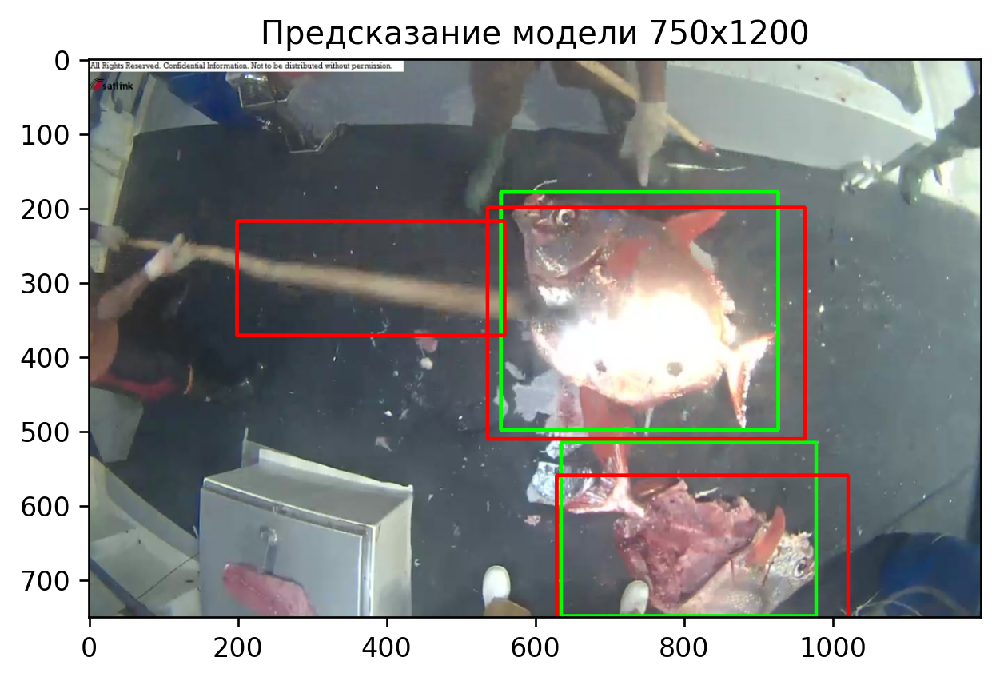

In [17]:
annotation = boxes['lag'][0]

_, sample_img = load_img(annotation['filename'])
pred = model.predict(np.array([sample_img,]))

decoded = decode_prediction(pred[0], conf_thr=0.1)
decoded = non_max_suppression(decoded,
                              max_output_size=5,
                              iou_threshold=0.1)

plt.figure(figsize=(6, 6), dpi=240)
img = draw_boxes(annotation, decoded, (IMG_WIDTH, IMG_HEIGHT))
plt.imshow(img)
plt.title('Предсказание модели {}x{}'.format(*img.shape));

## Визуализируем предсказание на тесте

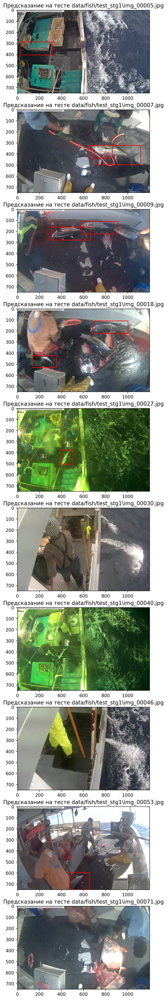

In [35]:
test_images = glob('data/fish/test_stg1/*.jpg')[:10]


plt.figure(figsize=(6, 4 * len(test_images)), dpi=240)

for i, filename in enumerate(test_images):
    _, sample_img = load_img(filename)
    pred = model.predict(np.array([sample_img,]))

    decoded = decode_prediction(pred[0], conf_thr=0.1)
    decoded = non_max_suppression(decoded,
                                  max_output_size=2,
                                  iou_threshold=0.1)
    
    plt.subplot(len(test_images), 1, i + 1)
    img = draw_boxes({'filename': filename}, decoded, (IMG_WIDTH, IMG_HEIGHT))
    plt.imshow(img)
    plt.title('Предсказание на тесте {}'.format(filename));

## Агрегация результатов

In [19]:
# TODO: предскажите класс рыбы для фотографии из тестовой выборки
#
# Подготовьте файл с предсказаниями вероятностей для каждой фотографии:
# image,ALB,BET,DOL,LAG,NoF,OTHER,SHARK,YFT
# img_00001.jpg,1,0,0,0,0,...,0
# img_00002.jpg,0.3,0.1,0.6,0,...,0

In [71]:
def make_predictions(path_f):
    ptable = pd.DataFrame(columns=['image', 'ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK','YFT'])
    images_detect=glob(path_f+'/*.jpg')
    for i, filename in tqdm(enumerate(images_detect)):
        bn = os.path.basename(filename)
        _, sample_img = load_img(filename)
        
        pred = model.predict(np.array([sample_img,]))
        
        decoded = decode_prediction(pred[0], conf_thr=0.1)
        decoded = non_max_suppression(decoded, max_output_size=1, iou_threshold=0.1)
        if len(decoded) > 0:
            decoded1 = decoded[0]['labels']

            ptable.loc[i, 'image'] = bn
            ptable.loc[i, 'ALB'] = decoded1[5]
            ptable.loc[i, 'BET'] = decoded1[1]
            ptable.loc[i, 'DOL'] = decoded1[4]
            ptable.loc[i, 'LAG'] = decoded1[3]
            ptable.loc[i, 'SHARK'] = decoded1[0]
            ptable.loc[i, 'YFT'] = decoded1[2]
        
            ptable.loc[i, 'NoF'] = 0.0
            ptable.loc[i, 'OTHER'] = 0.0
        else:
            ptable.loc[i, 'image'] = bn
            ptable.loc[i, 'ALB'] = 0.0
            ptable.loc[i, 'BET'] = 0.0
            ptable.loc[i, 'DOL'] = 0.0
            ptable.loc[i, 'LAG'] = 0.0
            ptable.loc[i, 'SHARK'] = 0.0
            ptable.loc[i, 'YFT'] = 0.0
        
            ptable.loc[i, 'NoF'] = 1.
            ptable.loc[i, 'OTHER'] = 0.0

#     i += 1    
    
#     for j, filename in enumerate(glob('data/fish/test_stg2/*.jpg')):
#         bn = os.path.basename(filename)
        
#         bn = "test_stg2/" + bn
#         _, sample_img = load_img(filename)
        
#         pred = model.predict(np.array([sample_img,]))

#         decoded = decode_prediction(pred, conf_thr=0.1)
#         decoded = non_max_suppression(decoded,
#                               max_output_size=1,
#                               iou_threshold=0.1)
#         if len(decoded) > 0:
#             decoded1 = decoded[0]['labels']

#             ptable.loc[i + j, 'image'] = bn
#             ptable.loc[i + j, 'ALB'] = decoded1[5]
#             ptable.loc[i + j, 'BET'] = decoded1[1]
#             ptable.loc[i + j, 'DOL'] = decoded1[4]
#             ptable.loc[i + j, 'LAG'] = decoded1[3]
#             ptable.loc[i + j, 'SHARK'] = decoded1[0]
#             ptable.loc[i + j, 'YFT'] = decoded1[2]
        
#             ptable.loc[i + j, 'NoF'] = 0.0
#             ptable.loc[i + j, 'OTHER'] = 0.0
#         else:
#             ptable.loc[i + j, 'image'] = bn
#             ptable.loc[i + j, 'ALB'] = 0.0
#             ptable.loc[i + j, 'BET'] = 0.0
#             ptable.loc[i + j, 'DOL'] = 0.0
#             ptable.loc[i + j, 'LAG'] = 0.0
#             ptable.loc[i + j, 'SHARK'] = 0.0
#             ptable.loc[i + j, 'YFT'] = 0.0
        
#             ptable.loc[i + j, 'NoF'] = 1.0
#             ptable.loc[i + j, 'OTHER'] = 0.0

    return ptable   

In [72]:
pred_table = make_predictions('data/fish/test_stg1')
pred_table.to_csv("stg1_submit.csv", index=False)
print(os.listdir("./"))

['.ipynb_checkpoints', '007-detection.ipynb', 'data', 'fishdetector.hdf5', 'neto_submit.csv', 'the-nature-conservancy-fisheries-monitoring']


In [75]:
pred_table.head()

,image,ALB,BET,DOL,LAG,NoF,OTHER,SHARK,YFT
0,image_00001.jpg,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,image_00002.jpg,0.166972,0.167247,0.166887,0.166414,0.0,0.0,0.166385,0.166094
2,image_00003.jpg,0.163757,0.161934,0.168637,0.175245,0.0,0.0,0.173084,0.157343
3,image_00004.jpg,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,image_00005.jpg,0.166179,0.163364,0.168608,0.170232,0.0,0.0,0.169458,0.162158


In [74]:
pred_table = make_predictions('data/fish/test_stg2')
pred_table.to_csv("stg2_submit.csv", index=False)
print(os.listdir("./"))

['.ipynb_checkpoints', '007-detection.ipynb', 'data', 'fishdetector.hdf5', 'HW_RIY_FISH.ipynb', 'hw_stg1_submit.csv', 'hw_stg2_submit.csv', 'stg1_submit.csv', 'stg2_submit.csv', 'the-nature-conservancy-fisheries-monitoring']
